# Design of Experiment: Optimize perovskite solar cells efficiency

This notebook is made to use optimPV for experimental design. Here, we show how to load some data from a presampling, and how to use optimPV to suggest the next set of experiment using Bayesian optimization.
The goal here is to optimize the processing conditions for a perovskite solar cell to maximize the power conversion efficiency (PCE).

Note: The data used here is real data generated in the [i-MEET](https://www.i-meet.ww.uni-erlangen.de/) and [HI-ERN](https://www.hi-ern.de/de) labs at the university of Erlangen-Nuremberg (FAU) by Jiyun Zhang for the paper: [Autonomous Optimization of Air-Processed Perovskite Solar Cell in a 6D Parameter Space](https://doi.org/10.1002/aenm.202404957)


In [1]:
# Import necessary libraries
import warnings, os, sys, torch
# remove warnings from the output
os.environ["PYTHONWARNINGS"] = "ignore"
warnings.filterwarnings(action='ignore', category=FutureWarning)
warnings.filterwarnings(action='ignore', category=UserWarning)
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import ax
from ax.utils.notebook.plotting import init_notebook_plotting, render
init_notebook_plotting() # for Jupyter notebooks

try:
    from optimpv import *
    from optimpv.optimizers.axBOtorch.axUtils import *
except Exception as e:
    sys.path.append('../') # add the path to the optimpv module
    from optimpv import *
    from optimpv.optimizers.axBOtorch.axUtils import *

[INFO 01-20 10:28:03] ax.utils.notebook.plotting: Injecting Plotly library into cell. Do not overwrite or delete cell.
[INFO 01-20 10:28:03] ax.utils.notebook.plotting: Please see
    (https://ax.dev/tutorials/visualizations.html#Fix-for-plots-that-are-not-rendering)
    if visualizations are not rendering.


## Get the data

In [2]:
# Define the path to the data 
data_dir =os.path.join(os.path.abspath('../'),'Data','6D_pero_opti') # path to the data directory

# Load the data
df = pd.read_csv(os.path.join(data_dir,'6D_pero_opti.csv'),sep=r'\s+') # load the data

# Display some information about the data
print(df.describe())

       Spin_Speed_1  Duration_t1  Spin_Speed_2  Dispense_Speed  Duration_t3  \
count     76.000000    76.000000     76.000000       76.000000    76.000000   
mean    1520.486842    18.276316   2273.289474      234.697368    17.315789   
std      458.510240     7.000188    501.488845       83.133470     7.919950   
min      540.000000     5.000000   1021.000000       16.000000     5.000000   
25%     1203.500000    13.750000   2019.500000      201.750000    10.750000   
50%     1511.000000    18.000000   2385.500000      247.500000    17.000000   
75%     1801.250000    22.000000   2671.000000      277.500000    23.250000   
max     2579.000000    34.000000   3000.000000      396.000000    35.000000   

       Spin_Speed_3        Jsc        Voc         FF       Pmax       Vmpp  \
count     76.000000  76.000000  76.000000  76.000000  76.000000  76.000000   
mean    3717.789474  24.391395   1.021157   0.724692  18.320711   0.825778   
std      917.207346   1.872929   0.108197   0.055290  

## Define the parameters for the simulation

In [3]:
params = [] # list of parameters to be optimized

Spin_Speed_1 = FitParam(name = 'Spin_Speed_1', value = 1000, bounds = [500,3000], value_type = 'int', display_name='Spin Speed 1', unit='rpm', axis_type = 'linear')
params.append(Spin_Speed_1)

Duration_t1 = FitParam(name = 'Duration_t1', value = 10, bounds = [5,35], value_type = 'int', display_name='Duration t1', unit='s', axis_type = 'linear')
params.append(Duration_t1)

Spin_Speed_2 = FitParam(name = 'Spin_Speed_2', value = 1000, bounds = [1000,3000], value_type = 'int', display_name='Spin Speed 2', unit='rpm', axis_type = 'linear')
params.append(Spin_Speed_2)

Dispense_Speed = FitParam(name = 'Dispense_Speed', value = 100, bounds = [10,400], value_type = 'int', display_name='Dispense Speed', unit='rpm', axis_type = 'linear')
params.append(Dispense_Speed)

Duration_t3 = FitParam(name = 'Duration_t3', value = 10, bounds = [5,35], value_type = 'int', display_name='Duration t3', unit='s', axis_type = 'linear')
params.append(Duration_t3)

Spin_Speed_3 = FitParam(name = 'Spin_Speed_3', value = 3000, bounds = [2000,5000], value_type = 'int', display_name='Spin Speed 3', unit='rpm', axis_type = 'linear')
params.append(Spin_Speed_3)


## Run the optimization

In [4]:
# Define the Agent and the target metric/loss function
from optimpv.general.SuggestOnlyAgent import SuggestOnlyAgent

suggest = SuggestOnlyAgent(params,exp_format='Pmax',minimize=False,tracking_exp_format=['Jsc','Voc','FF'],name=None)


In [5]:
from optimpv.optimizers.axBOtorch.axBOtorchOptimizer import axBOtorchOptimizer
from botorch.acquisition.logei import qLogNoisyExpectedImprovement 
from ax.adapter.transforms.standardize_y import StandardizeY
from ax.adapter.transforms.unit_x import UnitX
from ax.adapter.transforms.remove_fixed import RemoveFixed
from ax.adapter.transforms.log import Log
from ax.generators.torch.botorch_modular.utils import ModelConfig
from ax.generators.torch.botorch_modular.surrogate import SurrogateSpec
from gpytorch.kernels import MaternKernel
from gpytorch.kernels import ScaleKernel
from botorch.models.fully_bayesian import SaasFullyBayesianSingleTaskGP
model_gen_kwargs_list = None
parameter_constraints = None

model_kwargs_list = [{"torch_device":torch.device("cuda" if torch.cuda.is_available() else "cpu"),'botorch_acqf_class':qLogNoisyExpectedImprovement,'transforms':[RemoveFixed, Log, UnitX, StandardizeY],'surrogate_spec':SurrogateSpec(model_configs=[ModelConfig(botorch_model_class=SaasFullyBayesianSingleTaskGP,covar_module_class=ScaleKernel, covar_module_options={'base_kernel':MaternKernel(nu=2.5, ard_num_dims=len(params))})])}]
model_kwargs_list =None

# Define the optimizer
optimizer = axBOtorchOptimizer(params = params, agents = suggest, models = ['BOTORCH_MODULAR'],n_batches = [1], batch_size = [6], ax_client = None,  max_parallelism = -1, model_kwargs_list = model_kwargs_list, model_gen_kwargs_list = None, name = 'ax_opti',suggest_only = True,existing_data=df,verbose_logging=True)

In [6]:
optimizer.optimize() # run the optimization with ax

[WARNING 01-20 10:28:04] ax.api.client: Metric IMetric('Jsc') not found in optimization config, added as tracking metric.
[WARNING 01-20 10:28:04] ax.api.client: Metric IMetric('Voc') not found in optimization config, added as tracking metric.
[WARNING 01-20 10:28:04] ax.api.client: Metric IMetric('FF') not found in optimization config, added as tracking metric.
[INFO 01-20 10:28:04] optimpv.axBOtorchOptimizer: Attached trial 0 with parameters {'Spin_Speed_1': 2404, 'Duration_t1': 15, 'Spin_Speed_2': 1745, 'Dispense_Speed': 203, 'Duration_t3': 13, 'Spin_Speed_3': 4494} and raw data {'Pmax': np.float64(13.83), 'Jsc': np.float64(24.507), 'Voc': np.float64(0.91), 'FF': np.float64(0.6201)}
[INFO 01-20 10:28:04] optimpv.axBOtorchOptimizer: Attached trial 1 with parameters {'Spin_Speed_1': 1835, 'Duration_t1': 17, 'Spin_Speed_2': 2289, 'Dispense_Speed': 289, 'Duration_t3': 11, 'Spin_Speed_3': 4389} and raw data {'Pmax': np.float64(19.712), 'Jsc': np.float64(25.733), 'Voc': np.float64(1.009),

In [7]:
# get the best parameters and update the params list in the optimizer and the agent
ax_client = optimizer.ax_client # get the ax client
optimizer.update_params_with_best_balance() # update the params list in the optimizer with the best parameters
suggest.params = optimizer.params # update the params list in the agent with the best parameters

print("Best parameters found:")
for p in optimizer.params:
    print(f"{p.name}: {p.value} {p.unit} ")

Best parameters found:
Spin_Speed_1: 1165 rpm 
Duration_t1: 23 s 
Spin_Speed_2: 2063 rpm 
Dispense_Speed: 241 rpm 
Duration_t3: 32 s 
Spin_Speed_3: 2863 rpm 


Best value seen so far is  23.729 at iteration  27


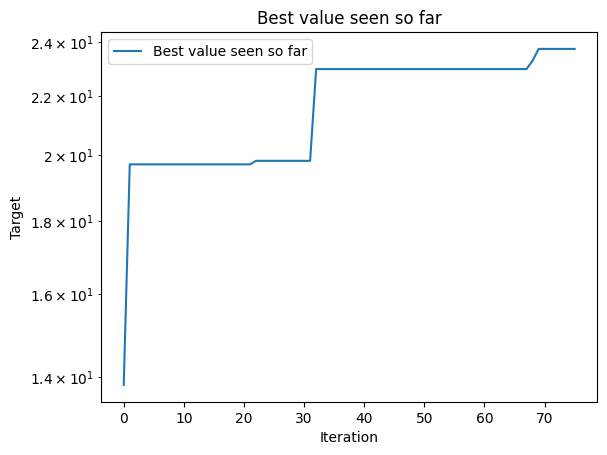

In [8]:
# Plot optimization results
data = ax_client.summarize()
all_metrics = optimizer.all_metrics
plt.figure()
plt.plot(np.maximum.accumulate(data[all_metrics]), label="Best value seen so far")
plt.yscale("log")
plt.xlabel("Iteration")
plt.ylabel("Target")
plt.legend()
plt.title("Best value seen so far")

print("Best value seen so far is ", max(data[all_metrics[0]]), "at iteration ", int(data[all_metrics[0]].idxmin()))

plt.show()

In [9]:
# print the parameters to that are running in data
to_run_next = data[data['trial_status'] == 'RUNNING']
print("Parameters to run next:")
print(to_run_next)

Parameters to run next:
    trial_index arm_name trial_status  generation_node  Jsc  Voc  FF  Pmax  \
76           76     76_0      RUNNING  BOTORCH_MODULAR  NaN  NaN NaN   NaN   
77           77     77_0      RUNNING  BOTORCH_MODULAR  NaN  NaN NaN   NaN   
78           78     78_0      RUNNING  BOTORCH_MODULAR  NaN  NaN NaN   NaN   
79           79     79_0      RUNNING  BOTORCH_MODULAR  NaN  NaN NaN   NaN   
80           80     80_0      RUNNING  BOTORCH_MODULAR  NaN  NaN NaN   NaN   
81           81     81_0      RUNNING  BOTORCH_MODULAR  NaN  NaN NaN   NaN   

    Spin_Speed_1  Duration_t1  Spin_Speed_2  Dispense_Speed  Duration_t3  \
76          2241           17          3000             397            5   
77          2370           15          3000             400            5   
78          2215           17          3000             339           35   
79          1311           18          2254             201           35   
80          2585           25          3000      

In [10]:
cards = ax_client.compute_analyses(display=True)

R2 = 0.501580692278599


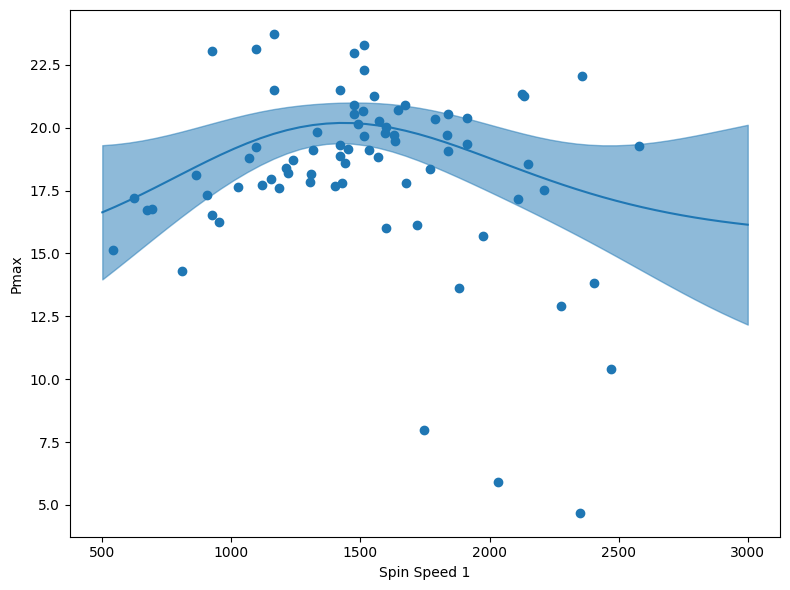

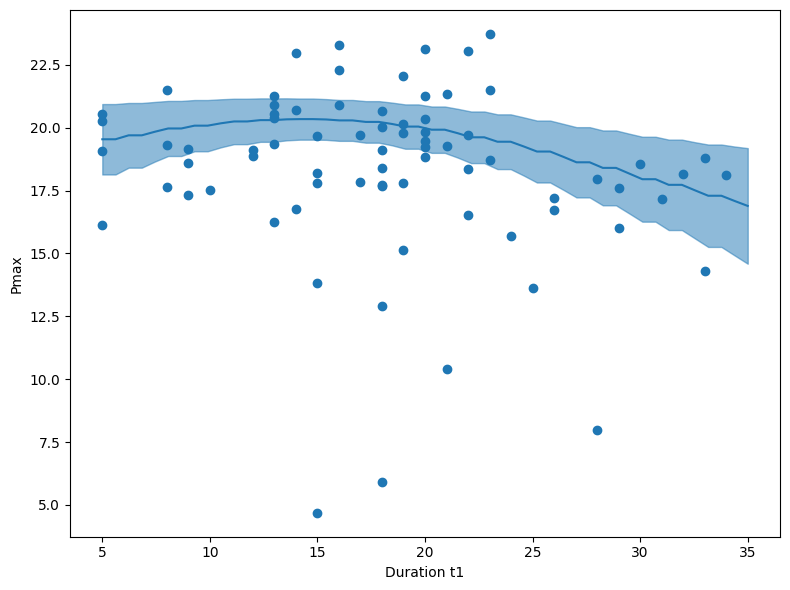

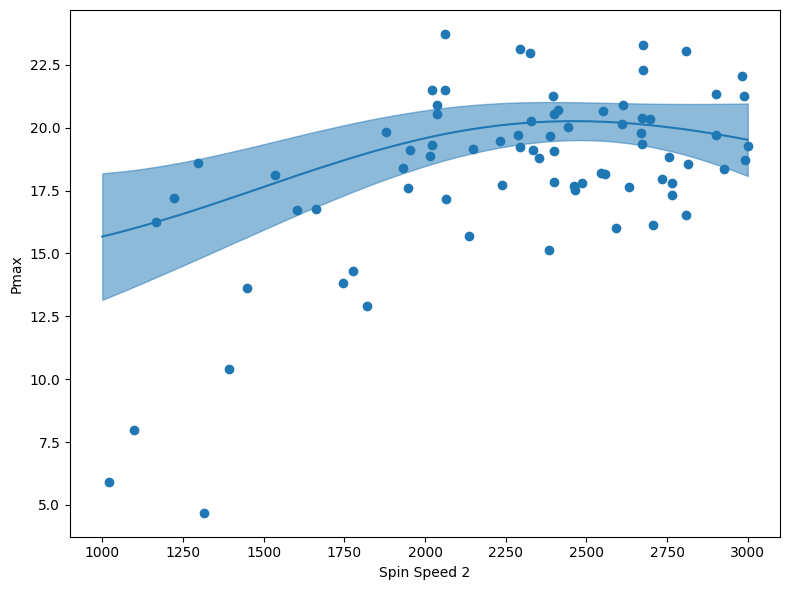

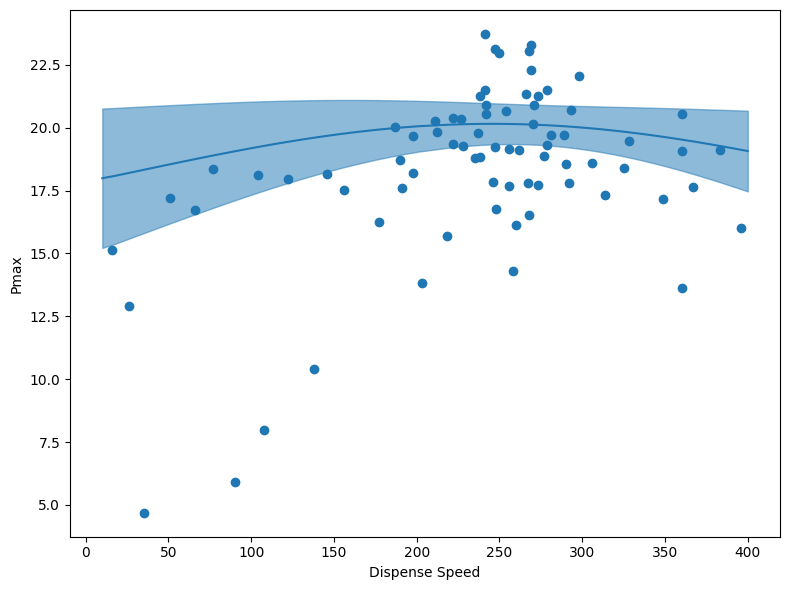

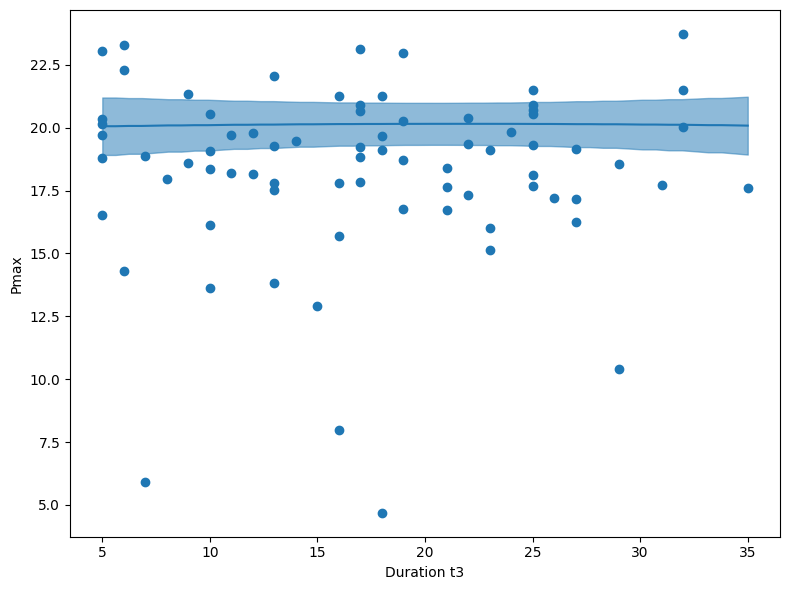

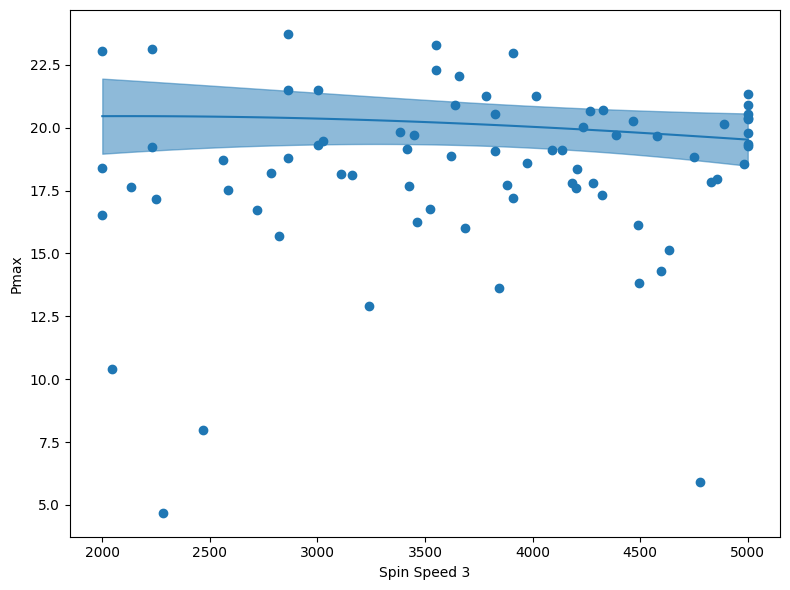

In [11]:
from ax.utils.notebook.plotting import render# for plotting in notebook
from ax.plot.slice import plot_slice
from ax.plot.scatter import interact_fitted 
from ax.adapter.cross_validation import cross_validate
from ax.plot.diagnostic import interact_cross_validation
from sklearn.metrics import r2_score

model = optimizer.ax_client._generation_strategy.adapter  # get the model from the ax client
cv_results = cross_validate(model)

# calculate the r2
observed, predicted = [], []
for i in range(len(cv_results)):
    observed.append(cv_results[i].observed.data.means[0])
    predicted.append(cv_results[i].predicted.means[0])
r2 = r2_score(observed, predicted)
print(f'R2 = {r2}')
render(interact_cross_validation(cv_results))

obj_type = 'Pmax' # objective type
p_idx = 0
for p_idx in range(len(optimizer.params)):
    x = ax.plot.slice.plot_slice(model=model,param_name= optimizer.params[p_idx].name, metric_name= obj_type).data['data'][1]['x']
    y = ax.plot.slice.plot_slice(model=model,param_name=optimizer.params[p_idx].name, metric_name= obj_type).data['data'][1]['y']
    x1 = ax.plot.slice.plot_slice(model=model,param_name= optimizer.params[p_idx].name, metric_name= obj_type).data['data'][0]['x']
    y1 = ax.plot.slice.plot_slice(model=model,param_name= optimizer.params[p_idx].name, metric_name= obj_type).data['data'][0]['y']
    # cut x1 and y1 to the same length as x and y
    x_low = x1[:len(x)]
    y_low = y1[:len(y)]
    x_high = x1[len(x):]
    y_high = y1[len(y):][::-1]

    plt.figure(figsize=(8,6))
    plt.plot(x,y)
    # shade the area between the two curves
    plt.fill_between(x, y_low, y_high, color='C0', alpha=0.5)
    # plt.fill_between(x, y, y_high, color='gray', alpha=0.5)
    plt.plot(data[optimizer.params[p_idx].name],data[obj_type],'C0o')
    plt.xlabel(optimizer.params[p_idx].display_name)
    plt.ylabel(obj_type)
    plt.tight_layout()
    plt.show()



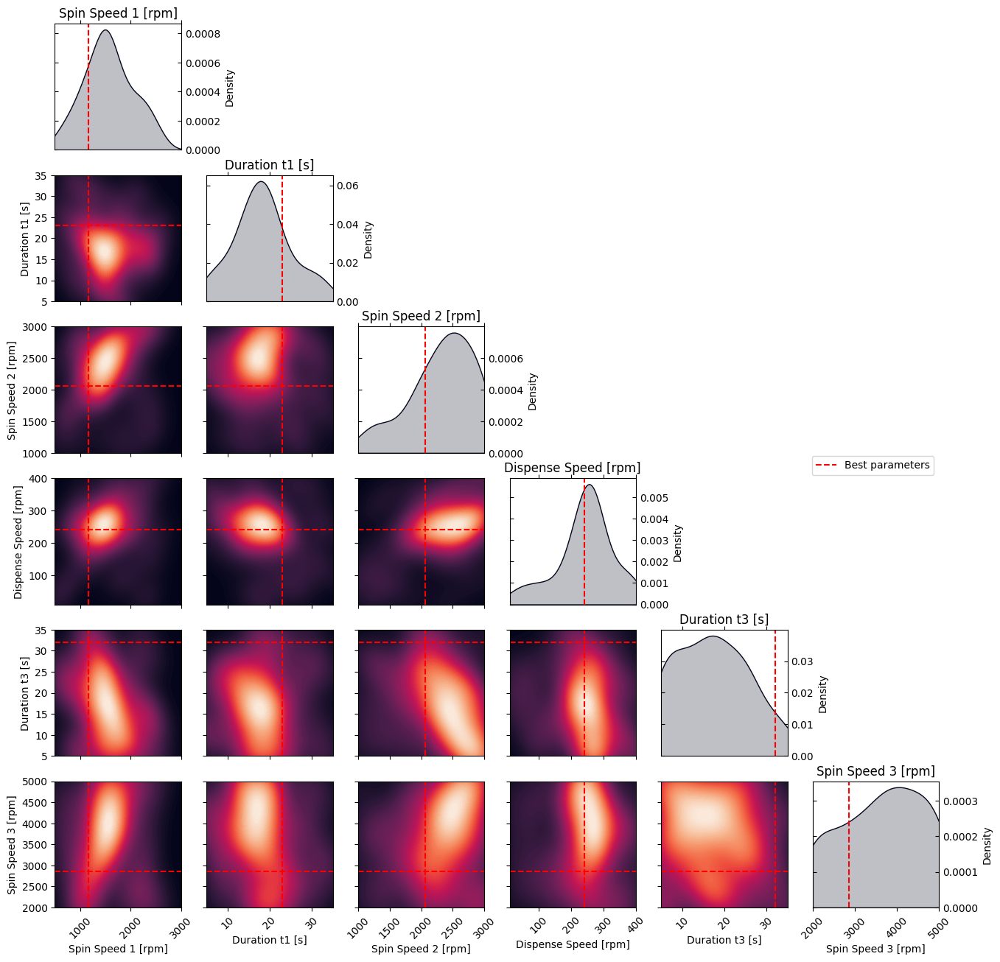

In [12]:
# Plot the density of the exploration of the parameters
# this gives a nice visualization of where the optimizer focused its exploration and may show some correlation between the parameters
plot_dens = True
if plot_dens:
    from optimpv.posterior.exploration_density import *
    params_orig_dict, best_parameters = {}, {}
    for p in optimizer.params:
        best_parameters[p.name] = p.value

    fig_dens, ax_dens = plot_density_exploration(params, optimizer = optimizer, best_parameters = best_parameters,  optimizer_type = 'ax')
